Window 1:
[[1.11145566e-03 2.18729951e-04 4.38524039e-04 3.61705056e-04
  3.42162225e-04 6.50324616e-04 2.68164692e-04 6.49945645e-04
  5.37232697e-04 1.16338704e-04 9.41260391e-05 5.51745416e-04
  9.20353865e-04 1.12664327e-03 2.45929806e-04 2.91941694e-04
  4.30938209e-04 1.65591097e-03]
 [1.37673045e-03 1.18353322e-03 1.19262860e-03 8.64572798e-04
  2.10292417e-04 1.13115659e-03 1.09649171e-03 3.45288356e-04
  4.96399244e-04 8.23008825e-04 6.96851782e-05 1.24456121e-04
  4.99270316e-04 2.90714576e-04 7.59470637e-04 5.54190246e-04
  1.22361354e-03 1.28042367e-03]
 [6.02735297e-04 1.45844348e-03 1.70147314e-03 1.46084291e-03
  6.91160186e-04 1.31500566e-03 7.61687949e-04 3.43227095e-04
  6.08860008e-05 1.28963649e-04 6.10386396e-04 2.54782588e-04
  4.04000885e-04 4.04123564e-04 5.97917692e-04 1.61743204e-03
  2.92213191e-03 1.12524380e-03]
 [6.46734817e-04 1.62201555e-03 1.13753038e-03 1.64455102e-03
  1.74166263e-04 3.23853378e-04 4.85509932e-04 3.02464511e-04
  2.55097948e-04 2.8264

c:\Users\herma\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


9/9 [==============================] - 0s 45ms/step - loss: 1.3591 - accuracy: 0.6964 - val_loss: 1.1382 - val_accuracy: 0.7288
Epoch 3/600
9/9 [==============================] - 0s 47ms/step - loss: 1.4307 - accuracy: 0.7268 - val_loss: 2.9311 - val_accuracy: 0.7458
Epoch 4/600
9/9 [==============================] - 0s 50ms/step - loss: 11.2948 - accuracy: 0.6907 - val_loss: 37.2586 - val_accuracy: 0.6780
Epoch 5/600
9/9 [==============================] - 0s 48ms/step - loss: 51.5897 - accuracy: 0.6395 - val_loss: 46.3297 - val_accuracy: 0.6949
Epoch 6/600
9/9 [==============================] - 1s 58ms/step - loss: 224.2092 - accuracy: 0.6565 - val_loss: 1.8283 - val_accuracy: 0.7288
Epoch 7/600
9/9 [==============================] - 0s 48ms/step - loss: 140.8985 - accuracy: 0.6338 - val_loss: 1.1709 - val_accuracy: 0.6102
Epoch 8/600
9/9 [==============================] - 0s 46ms/step - loss: 749.6346 - accuracy: 0.6015 - val_loss: 1.9421 - val_accuracy: 0.6102
Epoch 9/600
9/9 [=====

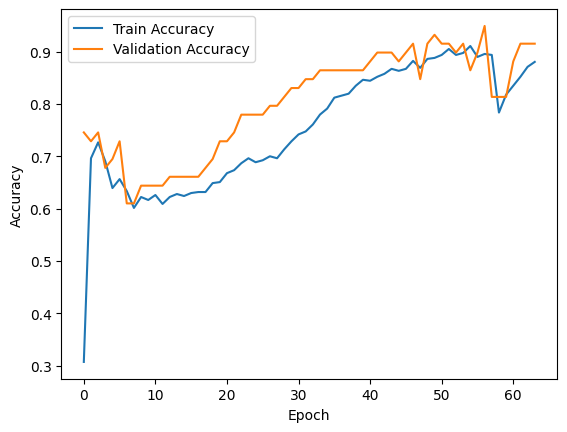

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import accuracy_score

# Load data
data = pd.read_csv('D:/Sensorprobe/model_new_01.csv')

# Preprocessing
X = data.drop(['class', 'activity'], axis=1).values
y = data['class']
num_classes = 6

# Sliding window size and step
window_size = 50
step_size = 5

# Create sliding windows for X and y
X_windows = np.array([X[i:i+window_size] for i in range(0, len(X) - window_size + 1, step_size)])
y_windows = np.array([y[i+window_size-1] for i in range(0, len(y) - window_size + 1, step_size)])

# Print the contents of each sliding window
for i, window in enumerate(X_windows):
    print(f"Window {i+1}:\n{window}")
    print("=" * window_size)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_windows, y_windows, test_size=0.2, stratify=y_windows)

# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train.reshape(-1, X.shape[1])).reshape(X_train.shape)
X_test = scaler.transform(X_test.reshape(-1, X.shape[1])).reshape(X_test.shape)

# Build LSTM model
model = Sequential([
    LSTM(64, input_shape=(window_size, X_train.shape[2]), return_sequences=True, activation='relu'),
    Dropout(0.2),
    LSTM(32, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Compile the model
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
print(model.summary())

# Define Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=12, restore_best_weights=True),
    ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True)
]

# Train the model
history = model.fit(
    X_train, y_train,
    batch_size=64,
    epochs=600,
    validation_split=0.1,
    callbacks=callbacks,
    verbose=1
)

# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_acc)

# Predict class labels
y_pred_probs = model.predict(X_test)
y_pred_labels = np.argmax(y_pred_probs, axis=1)
y_true_labels = y_test

# Print predicted and true class labels
output_lines = [
    f"Predicted Class: {pred}    True Class: {true}"
    for pred, true in zip(y_pred_labels, y_true_labels)
]

output = "\n".join(output_lines)
print(output)

# Calculate accuracy using accuracy_score
accuracy = accuracy_score(y_true_labels, y_pred_labels)
print("Total:", len(y_true_labels))
print("Accuracy:", accuracy)

# Plot model performance
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()
